# Assignment 2
### Due: Sunday, February 9

For this assignment you will experiment with various classification models using subsets of some real-world data sets. In particular, you will use the K-Nearest-Neighbor algorithm to classify text documents, experiment with and compare classifiers that are part of the scikit-learn machine learning package for Python, and use some additional preprocessing capabilities of pandas and scikit-learn packages.



## 1.  K-Nearest-Neighbor (KNN) classification on Newsgroups [Dataset: newsgroups.zip]

For this problem you will use a subset of the 20 Newsgroup data set. The full data set contains 20,000 newsgroup documents, partitioned (nearly) evenly across 20 different newsgroups and has been often used for experiments in text applications of machine learning techniques, such as text classification and text clustering (see the description of the full dataset). The assignment data set contains a subset of 1000 documents and a vocabulary of  5,500 terms. Each document belongs to one of two classes Hockey (class label 1) and Microsoft Windows (class label 0). The data has already been split (80%, 20%) into training and test data. The class labels for the training and test data are also provided in separate files. The training and test data are on term x document format, containing a row for each term in the vocabulary and a column for each document. The values in the table represent raw term occurence counts. The data has already been preprocessed to extract tokens, remove stop words and perform stemming (so, the terms in the vocabulary are stems not full terms). Please be sure to read the readme.txt file in the distribution.

Your tasks in this problem are the following [Note: for this problem you should not use scikit-learn for classification, but create your own KNN classifer. You may use Pandas, NumPy, standard Python libraries, and Matplotlib.]

    The dataset is a subset of the 20 newsgroup corpus http://qwone.com/~jason/20Newsgroups/  in term-document format. This subset has been taken from http://mlg.ucd.ie/content/view/22/ (this data was modified to remove terms that did not appear in any of the documents). Each document belong to one of the two classes {Windows, Hockey}. The original data has been divided into test and train (20%, 80%) subsets.

    The files contained in the archive file are as follows: 

In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

1. trainMatrixModified.txt: the term-document frequency matrix for the training documents. Each row of this matrix corresponds to one the terms and each column corresponds to one the documents and the (i,j)th element of the matrix shows the frequency of the ith term in the jth document. This matrix contains 5500 rows and 800 columns.

In [2]:
#term-document frequency matrix
trainMatrixModified = pd.read_csv("trainMatrixModified.txt", header=None , delimiter='\t')
print(trainMatrixModified.shape)
train=trainMatrixModified.T
train

(5500, 800)


,0,1,2,3,4,5,6,7,8,9,...,5490,5491,5492,5493,5494,5495,5496,5497,5498,5499
0,2.0,2.0,2.0,1.0,8.0,6.0,2.0,8.0,2.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
796,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
797,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
798,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


5. modifiedterms.txt: This file contains the set of 5500 terms in the vocabulary. Each line contains a term and corresponds to the corresponding rows in term-document frequency matrices. 

In [3]:
#term
modifiedterms = pd.read_csv("modifiedterms.txt", header=None)
print(modifiedterms.shape)
modifiedterms.head()

(5500, 1)


,0
0,david
1,rex
2,wood
3,subject
4,call


3. trainClasses.txt: This file contains the labels associated with each training document. Each line is in the format of documentIndex \t classId where the documentIndex is in the range of [0,800) and refers to the index of the document in the term-document frequency matrix for train documents. The classId refers to one of the two classes and takes one of the values 0 (for Windows) or 1 (for Hockey).

In [4]:
# Label:  0 (for Windows) or 1 (for Hockey).
trainClasses = pd.read_csv("trainClasses.txt", header=None, delimiter='\t').iloc[:,1:]
print(trainClasses.shape)
trainClasses.columns= range(1)
trainClasses.head()
trainlabel=trainClasses.T
trainlabel

(800, 1)


,0,1,2,3,4,5,6,7,8,9,...,790,791,792,793,794,795,796,797,798,799
0,0,1,0,1,0,1,1,1,1,1,...,0,1,1,0,1,0,1,1,1,1


 2. testMatrixModified.txt: the term-document frequency for the test documents. The matrix contains 5500 rows and 200 columns.

In [5]:
#term
testMatrixModified = pd.read_csv("testMatrixModified.txt", header=None,delimiter='\t')
print(testMatrixModified.shape)
test=testMatrixModified.T
test

(5500, 200)


,0,1,2,3,4,5,6,7,8,9,...,5490,5491,5492,5493,5494,5495,5496,5497,5498,5499
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
196,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


4. testClasses.txt: This file contains the labels associated with each test document. Each line is in the format of documentIndex \t classId where the documentIndex is in the range of [0,200) and refers to the index of the document in the term-document frequency matrix for test documents 

In [6]:
testClasses=pd.read_csv("testClasses.txt", header=None , delimiter='\t').iloc[:,1:]
print(testClasses.shape)
testClasses.columns= range(1)
testlabel=testClasses.T
testlabel

(200, 1)


,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,1,0,0,1,1,0,1,1,0,1,...,0,0,0,0,0,1,1,0,1,1


[959.0, 720.0, 680.0, 578.0, 545.0, 483.0, 470.0, 429.0, 401.0, 378.0]


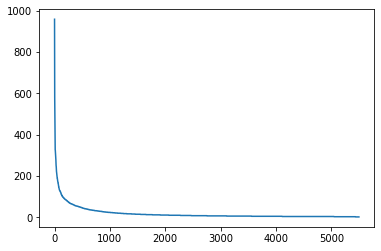

In [7]:
termFreqs = trainMatrixModified.sum(axis=1)
print(sorted(termFreqs,reverse=True)[:10])
plt.plot(sorted(termFreqs, reverse=True))
plt.show()
#zipf distribution

In [8]:
test=np.array(test)
train=np.array(train)
test[0].shape

(5500,)

### a.
Create your own KNN classifier function. Your classifier should allow as input the training data matrix, the training labels, the instance to be classified, the value of K, and should return the predicted class for the instance and the indices of the top K neighbors. Your classifier should work with Euclidean distance as well as Cosine Similarity. You may create two separate classifiers, or add the distance metric as a parameter in the classifier function.

#### Create KNN classifier function

In [9]:
from collections import Counter

def knn_search(x, D, K, measure):
    """ find K nearest neighbors of an instance x among the instances in D """
    if measure == 0:
        # euclidean distances from the other points
        dists = np.sqrt(((D - x)**2).sum(axis=1))
    elif measure == 1:
        # first find the vector norm for each instance in D as wel as the norm for vector x
        D_norm = np.array([np.linalg.norm(D[i]) for i in range(len(D))])
        x_norm = np.linalg.norm(x)
        # Compute Cosine: divide the dot product o x and each instance in D by the product of the two norms
        sims = np.dot(D,x)/(D_norm * x_norm)
        # The distance measure will be the inverse of Cosine similarity
        dists = 1-sims
    idx = np.argsort(dists) # sorting
    # return the indexes of K nearest neighbors
    return idx[:K], dists

neigh_idx, distances = knn_search(test[1], train, 5, 0)
print("euclidean distances: \n \n{} \n".format(neigh_idx))

neigh_idx, distances = knn_search(test[1], train, 5, 1)
print("Cosine similarity: \n \n{} \n".format(neigh_idx))


euclidean distances: 
 
[798 554 757 224  38] 

Cosine similarity: 
 
[382 775 163 587 550] 



from sklearn import neighbors

def findbest_knn(k,weight):
    order=0
    best=0
    for i in range(1,k):    
        n_neighbors = i
        knnclf = neighbors.KNeighborsClassifier(n_neighbors, weights=weight)
        knnclf.fit(train, trainClasses)
        knnpreds_test = knnclf.predict(test)
        #print(np.ravel(knnpreds_test))
        knncm = confusion_matrix(list(np.ravel(testClasses)), knnpreds_test)
        #print(i)
        #print(knncm)
        accuracy=knnclf.score(test, testClasses)
        #print(accuracy)
        if accuracy > best:
        #    print(knncm)
            order=i
            #print(i)
            best=accuracy
            #print(best)
    return knncm,order,best


findbest_knn(10,'distance')

### b.
Create an evaluation function to measure the effectiveness of your classifier. This function will call the classifier function in part a on all the test instances and in each case compares the actual test class label to the predicted class label. It should take as input the training data, the training labels, the test instances, the labels for test instances, and the value of K. Your evaluation function should return three the Classification Accuracy (ratio of correct predictions to the number of test instances) [See class notes: Classification & Prediction - Review of Basic Concepts].


#### Create an evaluation function to measure the effectiveness of your classifier

In [10]:
from sklearn import neighbors
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

def evaluation(k,method):
    errorCount = 0.0
    test_perdict=[]
    rows=testMatrixModified.shape[1]
    for i in range(rows):
        neigh_idx, distances = knn_search(test[i], train, k , method)
#distances = pd.Series(distances, index=train.index)
#distances
#print("Query:", testMatrixModified[1])
#print("\nNeighbors:")
#print(neigh_idx)
        neigh_labels = trainClasses.iloc[neigh_idx][0]
#from collections import Counter
        perdict=Counter(neigh_labels).most_common(1)
        test_perdict.append(perdict[0][0])
        #print(perdict[0][0])
        #print(testlabel[i])
        if (perdict[0][0] != testlabel[i][0]): 
            #print(str(perdict[0][0]))
            #print(str(testlabel[i][0]))
            errorCount += 1.0
    accuracy=1-errorCount/float(rows)
    #print("the total accuracy rate is: ", (1-errorCount/float(rows)))
    knncm=confusion_matrix(testClasses, test_perdict)
    #print(knncm)
    return accuracy, knncm                          

#main(0)
accuracy, knncm =evaluation(9,1)
#print("the total accuracy rate is: ", accuracy)
print("Accuracy: {}".format(accuracy))
print("Confusion Matrix: \n{}".format(knncm))


Accuracy: 0.975
Confusion Matrix: 
[[98  1]
 [ 4 97]]


### c. 
Run your evaluation function on a range of values for K in order to compare accuracy values for different numbers of neighbors. Do this both using Euclidean Distance as well as Cosine similarity measure. [For example, you can try evaluating your classifiers on a range of values of K from 1 through 20 (or greater)]. Present the results as graphs with K in the x-axis and the evaluation metric (accuracy) on the y-axis. 

#### Use a single plot to compare the two version of the classifier (Eculidean distanve version vs. cosine similarity version).


[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
[0.78, 0.78, 0.81, 0.81, 0.815, 0.835, 0.765, 0.8, 0.75, 0.85, 0.795, 0.845, 0.775, 0.815, 0.785, 0.8, 0.76, 0.785, 0.74, 0.765]
[0.985, 0.985, 0.97, 0.985, 0.97, 0.985, 0.98, 0.98, 0.975, 0.985, 0.98, 0.975, 0.98, 0.98, 0.985, 0.98, 0.975, 0.975, 0.975, 0.975]


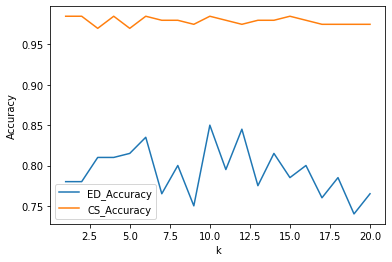

In [11]:
k=[]
ED_Accuracy=[]
CS_Accuracy=[]
for i in  range(1,21):
    #print(i)
    k.append(i)
    csaccuracy, knncm = evaluation(i,1)
    CS_Accuracy.append(csaccuracy)
    #print(i)
    edaccuracy,knncm = evaluation(i,0)
    ED_Accuracy.append(edaccuracy)
    
print(k)
print(ED_Accuracy)
print(CS_Accuracy)

plt.plot(np.array(k), ED_Accuracy, label='ED_Accuracy')
plt.plot(k, CS_Accuracy, label='CS_Accuracy')
plt.legend( ('ED_Accuracy','CS_Accuracy') )
plt.ylabel('Accuracy')
plt.xlabel('k')
plt.show()

### d.
Next, modify the training and test data sets so that term weights are converted to TFxIDF weights (instead of raw term frequencies). [See class notes on Text Categorization]. Then, rerun your evaluation (only for the Cosine similairty version of the classifier) on the range of K values (as above) and compare the results to the results without using TFxIDF weights.

#### TFxIDF weights

##### Train dataset

In [12]:
numTerms=train.shape[0]
#print(numTerms)
#800
NDocs = train.shape[1]
#print(NDocs)
#5500

# data frequency,sum up all the same rows
DF = pd.DataFrame([(train!=0).sum(1)]).T
#print(DF)

#creat full 5500 document martix
NMatrix=np.ones(np.shape(train), dtype=float)*NDocs
np.set_printoptions(precision=2,suppress=True,linewidth=100)
#print(NMatrix)

# Convert each entry into IDF values
# IDF is the log of the inverse of document frequency
# Note that IDF is only a function of the term, so all columns will be identical.
IDF = np.log2(np.divide(NMatrix, np.array(DF)))
#print(IDF)
TD_tfidf = train * IDF
pd.set_option("display.precision", 2)
pd.DataFrame(TD_tfidf)

,0,1,2,3,4,5,6,7,8,9,...,5490,5491,5492,5493,5494,5495,5496,5497,5498,5499
0,11.62,11.62,11.62,5.81,46.48,34.86,11.62,46.48,11.62,23.24,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00,0.00,0.00,6.49,6.49,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.00,0.00,7.00,0.00,0.00,0.00,14.00,0.00,7.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,14.59,0.00,0.00,7.30,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,15.45,0.00,0.00,7.72,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,0.00,0.00,0.00,7.84,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
796,0.00,0.00,0.00,7.38,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
797,0.00,0.00,0.00,6.22,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
798,0.00,0.00,0.00,11.43,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##### Test data set

In [13]:
numTerms=test.shape[0]
#print(numTerms)
#800
NDocs = test.shape[1]
#print(NDocs)
#5500

# data frequency,sum up all the same rows
DF = pd.DataFrame([(test!=0).sum(1)]).T
#print(DF)

#creat full 5500 document martix
NMatrix=np.ones(np.shape(test), dtype=float)*NDocs
np.set_printoptions(precision=2,suppress=True,linewidth=100)
#print(NMatrix)

# Convert each entry into IDF values
# IDF is the log of the inverse of document frequency
# Note that IDF is only a function of the term, so all columns will be identical.
IDF = np.log2(np.divide(NMatrix, np.array(DF)))
#print(IDF.shape)
Test_tfidf = test * IDF
pd.set_option("display.precision", 2)
pd.DataFrame(Test_tfidf)

,0,1,2,3,4,5,6,7,8,9,...,5490,5491,5492,5493,5494,5495,5496,5497,5498,5499
0,0.00,0.0,0.0,5.55,0.0,0.0,0.0,0.0,0.0,5.55,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00,0.0,0.0,6.87,0.0,0.0,0.0,0.0,0.0,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6.78,0.0,0.0,6.78,0.0,0.0,0.0,0.0,0.0,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.00,0.0,0.0,4.50,0.0,0.0,0.0,0.0,0.0,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.00,0.0,0.0,6.67,0.0,0.0,0.0,0.0,0.0,6.67,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.00,0.0,0.0,7.38,0.0,0.0,0.0,0.0,0.0,7.38,...,7.38,7.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
196,0.00,0.0,0.0,5.01,0.0,0.0,0.0,0.0,0.0,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.00,0.0,0.0,9.26,0.0,0.0,0.0,0.0,0.0,0.00,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,0.00,0.0,0.0,6.54,0.0,0.0,0.0,0.0,0.0,6.54,...,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
DT_tfidf = TD_tfidf
#print(DT_tfidf)
DT_array = np.array(DT_tfidf)
#print(DT_array)
#neigh_idx, distances = knn_search(test_tfidf[1], DT_array, 5, 1)
#for i in range(rows):
#    test_tfidf = testMatrixModified[i]* IDF[0]
#    neigh_idx, distances = knn_search(test_tfidf.T, DT_array, 10, 1)
#   # print(neigh_idx)

def evaluation_tfidf(k,method):
    errorCount = 0.0
    test_perdict=[]
    rows=testlabel.shape[1]
    #print(rows)
    for i in range(rows):
        test_tfidf = Test_tfidf[i]
        neigh_idx, distances = knn_search(test_tfidf.T, DT_array, k, method)
#distances = pd.Series(distances, index=train.index)
#distances
#print("Query:", testMatrixModified[1])
#print("\nNeighbors:")
#print(neigh_idx)
        neigh_labels = trainClasses.iloc[neigh_idx][0]
#from collections import Counter
        perdict=Counter(neigh_labels).most_common(1)
        test_perdict.append(perdict[0][0])
        #print(perdict[0][0])
        #print(testlabel[i][0])
        if (perdict[0][0] != testlabel[i][0]): 
            #print(str(perdict[0][0]))
            #print(str(testlabel[i][0]))
            errorCount += 1.0
    accuracy=1-errorCount/float(rows)
    #print("the total accuracy rate is: ", (1-errorCount/float(rows)))
    knncm=confusion_matrix(testClasses, test_perdict)
    #print(knncm)
    return accuracy, knncm                          

#main(0)
for i in range(1,10):
    accuracy, knncm =evaluation_tfidf(i,1)
    print("the total accuracy rate is: ", accuracy)
    print(knncm)

the total accuracy rate is:  0.985
[[98  1]
 [ 2 99]]
the total accuracy rate is:  0.985
[[98  1]
 [ 2 99]]
the total accuracy rate is:  0.97
[[98  1]
 [ 5 96]]
the total accuracy rate is:  0.99
[[ 98   1]
 [  1 100]]
the total accuracy rate is:  0.97
[[97  2]
 [ 4 97]]
the total accuracy rate is:  0.985
[[99  0]
 [ 3 98]]
the total accuracy rate is:  0.98
[[98  1]
 [ 3 98]]
the total accuracy rate is:  0.98
[[98  1]
 [ 3 98]]
the total accuracy rate is:  0.975
[[98  1]
 [ 4 97]]


#### In this range of accuracy, when k is 4 has the most best accuracy rate, 0.99.

### e.
Create a new classifier based on the Rocchio Method adapted for text categorization [See class notes on Text Categorization]. You should separate the training function from the classifiation function. 
The training part for the classifier can be implemented as a function that takes as input the training data matrix and the training labels, returning the prototype vectors for each class. 
The classification part can be implemented as another function that would take as input the prototypes returned from the training function and the instance to be classified. 
This function should measure Cosine similarity of the test instance to each prototype vector. Your output should indicate the predicted class for the test instance and the similarity values of the instance to each of the category prototypes.  
Finally, use your evaluation function to compare your results to the best KNN results you obtained earlier. [Note: your functions should work regardless of the number of categories (class labels) and should not be limited to two-class categorization scenario.]

## 2. Classification using scikit-learn [Dataset: bank_data.csv]
For this problem you will experiment with various classifiers provided as part of the scikit-learn (sklearn) machine learning module, as well as with some of its preprocessing and model evaluation capabilities.  [Note: This module is already part of the Anaconda distributions. However, if you are using standalone Python distributions, you will need to first obtain and install it]. You will work with a modified subset of a real data set of customers for a bank. This is the same data set used in Assignment 1. The data is provided in a CSV formatted file with the first row containing the attribute names. The description of the the different fields in the data are provided in this document.

Your tasks in this problem are the following:


In [16]:
BD = pd.read_csv("bank_data.csv", header=0)
#print(BD.columns)
BDmaxtrix=pd.get_dummies(BD[['age', 'income', 'children', 'gender', 'region', 'married', 'car',
       'savings_acct', 'current_acct', 'mortgage']])
print(BDmaxtrix.head(2))
BDpep = BD["pep"]
BDpep.head()

   age   income  children  gender_FEMALE  gender_MALE  region_INNER_CITY  \
0   48  17546.0         1              1            0                  1   
1   40  30085.1         3              0            1                  0   

   region_RURAL  region_SUBURBAN  region_TOWN  married_NO  married_YES  \
0             0                0            0           1            0   
1             0                0            1           0            1   

   car_NO  car_YES  savings_acct_NO  savings_acct_YES  current_acct_NO  \
0       1        0                1                 0                1   
1       0        1                1                 0                0   

   current_acct_YES  mortgage_NO  mortgage_YES  
0                 0            1             0  
1                 1            0             1  


0    YES
1     NO
2     NO
3     NO
4     NO
Name: pep, dtype: object

### a.
Load and preprocess the data using Pandas or similar tools. Specifically, you need to separate the target attribute ("pep") from the portion of the data to be used for training and testing. You will need to convert the selected dataset into the Standard Spreadsheet format (scikit-learn functions generally assume that all attributes are in numeric form). Finally, you need to split the transformed data into training and test sets (using 80%-20% randomized split). [Review Jupyter Notebooks from class to see examples of how to perform these tasks.]


In [17]:
from sklearn.model_selection import train_test_split

#split the transformed data into training and test sets (using 80%-20% randomized split)
BD_train, BD_test, BD_target_train, BD_target_test = train_test_split(BDmaxtrix, BDpep, 
                                                                      test_size=0.2, random_state=33)
print(BD_test.shape)
BD_test[0:5]


(120, 19)


,age,income,children,gender_FEMALE,gender_MALE,region_INNER_CITY,region_RURAL,region_SUBURBAN,region_TOWN,married_NO,married_YES,car_NO,car_YES,savings_acct_NO,savings_acct_YES,current_acct_NO,current_acct_YES,mortgage_NO,mortgage_YES
456,32,13267.6,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,0,1
366,59,29866.9,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,1,0
131,61,41609.5,3,0,1,0,1,0,0,0,1,1,0,0,1,0,1,0,1
448,53,48971.6,3,0,1,0,1,0,0,0,1,0,1,0,1,1,0,1,0
337,65,38080.9,1,0,1,1,0,0,0,0,1,0,1,0,1,1,0,0,1


In [18]:
#Performing min-max normalization to rescale numeric attributes

from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler().fit(BD_train)

BD_train_norm = min_max_scaler.transform(BD_train)
BD_train_norm = pd.DataFrame(BD_train_norm, columns=BD_train.columns, index=BD_train.index)


BD_test_norm = min_max_scaler.transform(BD_test)
BD_test_norm = pd.DataFrame(BD_test_norm, columns=BD_test.columns, index=BD_test.index)


### b.
Run scikit-learn's KNN classifier on the test set.

Note: in the case of KNN, you should first normalize the data so that all attributes are in the same scale (normalize so that the values are between 0 and 1).

Generate the confusion matrix (visualize it using Matplotlib), as well as the classification report. Also, compute the average accuracy score. 

Experiment with different values of K and the weight parameter (i.e., with or without distance weighting) for KNN to see if you can improve accuracy (you do not need to provide the details of all of your experimentation, but provide a short discussion on what parameters worked best as well as your final results).


In [19]:
from sklearn import neighbors
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [20]:
## ‘uniform’ : uniform weights. All points in each neighborhood are weighted equally.
##‘distance’ : weight points by the inverse of their distance. 

def findbest_knn(k,weight):
    order=0
    best=0
    for i in range(1,k):    
        n_neighbors = i
        knnclf = neighbors.KNeighborsClassifier(n_neighbors, weights=weight)
        knnclf.fit(BD_train_norm, BD_target_train)
        knnpreds_test = knnclf.predict(BD_test_norm)
        knncm = confusion_matrix(BD_target_test, knnpreds_test)
        #print(i)
        #print(knncm)
        accuracy=knnclf.score(BD_test_norm, BD_target_test)
        #print(accuracy)
        if accuracy > best:
        #    print(knncm)
            order=i
            #print(i)
            best=accuracy
            #print(best)
    return knncm,order,best

for i in [5,10,25,50]:
    uniform_knncm,order,best=findbest_knn(i,'uniform')
    print("If K is 1 to {} then and weight is uniform, the best k will be {} and accuracy will be {}".format(i,order,best))
    distance_knncm,order,best=findbest_knn(i,'distance')
    print("If K is 1 to {} then and weight is distance, the best k will be {} and accuracy will be {}".format(i,order,best))
    #plt.matshow(knncm)
    #plt.title('Confusion matrix')
    #plt.colorbar()
    #plt.ylabel('Actual')
    #plt.xlabel('Predicted')
    #plt.show()

If K is 1 to 5 then and weight is uniform, the best k will be 3 and accuracy will be 0.6583333333333333
If K is 1 to 5 then and weight is distance, the best k will be 3 and accuracy will be 0.6416666666666667
If K is 1 to 10 then and weight is uniform, the best k will be 8 and accuracy will be 0.6833333333333333
If K is 1 to 10 then and weight is distance, the best k will be 5 and accuracy will be 0.6583333333333333
If K is 1 to 25 then and weight is uniform, the best k will be 17 and accuracy will be 0.7
If K is 1 to 25 then and weight is distance, the best k will be 18 and accuracy will be 0.6833333333333333
If K is 1 to 50 then and weight is uniform, the best k will be 29 and accuracy will be 0.7333333333333333
If K is 1 to 50 then and weight is distance, the best k will be 36 and accuracy will be 0.7166666666666667


#### With different weights, have different k in good accuracy. Base on above testing, for k in 29 and weight uniform has 73% accuracy andfor k in 36 and weight distance has 72% accuracy

### c.
Repeat the classification using scikit-learn's decision tree classifier (using the default parameters) and the Naive Bayes (Gaussian) classifier. As above, generate the confusion matrix, classification report, and average accuracy scores for each classifier. For each model, compare the average accuracry scores on the test and the training data sets. What does the comparison tell you in terms of bias-variance trade-off?

In [21]:
from sklearn import tree

def findbest_tree(k):
    order=0
    best=0
    if k<3:
        print("plz set your min samples split above 3.")
    elif k ==3:
        findbest_tree(4)
    else:
        for i in range(3,k):  
            treeclf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=i)
            treeclf = treeclf.fit(BD_train_norm, BD_target_train)
            treepreds_test = treeclf.predict(BD_test_norm)
            accuracy=treeclf.score(BD_test_norm, BD_target_test)
            treecm = confusion_matrix(BD_target_test, treepreds_test)
            #print(i)
            if accuracy > best:
                #print(treecm)
                order=i
                #print(i)
                best=accuracy
                #print(best)
        return treecm,order,best

for i in [5,10,25,50]:
    treecm,order,best=findbest_tree(i)
    print("If K is 1 to {},  the best k will be {} and accuracy will be {}".format(i,order,best))
#print(treepreds_test)
#print(treeclf.score(BD_test_norm, BD_target_test))
#print(treeclf.score(BD_train_norm, BD_target_train))

If K is 1 to 5,  the best k will be 3 and accuracy will be 0.8166666666666667
If K is 1 to 10,  the best k will be 6 and accuracy will be 0.8166666666666667
If K is 1 to 25,  the best k will be 23 and accuracy will be 0.85
If K is 1 to 50,  the best k will be 23 and accuracy will be 0.85


#### With different min_samples_split, have different min_samples_split in good accuracy. Base on above testing, for min_samples_split in 23 has the most accuracy , and for the bias-variance trade-off, it seems that 23 will be the sweet spot so when min_samples_split lager might overcomplicate have more bias, also when min_samples_split too small might oversimplifiy have more bias

In [22]:
from sklearn import naive_bayes

nbclf = naive_bayes.GaussianNB()
nbclf = nbclf.fit(BD_train_norm, BD_target_train)
nbpreds_test = nbclf.predict(BD_test_norm)
accuracy=nbclf.score(BD_test_norm, BD_target_test)
print(accuracy)
print(nbclf.score(BD_train_norm, BD_target_train))

0.5916666666666667
0.6708333333333333


## 3. Data Analysis and Predictive Modeling on Census data [Dataset: adult-modified.csv]
For this problem you will use a simplified version of the Adult Census Data Set. In the subset provided here, some of the attributes have been removed and some preprocessing has been performed.

Your tasks in this problem are the following:

In [23]:
AdultMod = pd.read_csv("adult-modified.csv", header=0)
AdultMod=AdultMod.replace({'?': np.nan})
AdultMod=AdultMod.astype({'age': 'float64'})
AdultMod

,age,workclass,education,marital-status,race,sex,hours-per-week,income
0,39.0,Public,13,Single,White,Male,40,<=50K
1,50.0,Self-emp,13,Married,White,Male,13,<=50K
2,38.0,Private,9,Single,White,Male,40,<=50K
3,53.0,Private,7,Married,Black,Male,40,<=50K
4,28.0,Private,13,Married,Black,Female,40,<=50K
...,...,...,...,...,...,...,...,...
9995,38.0,Private,10,Married,White,Male,60,>50K
9996,25.0,Private,9,Single,White,Female,8,<=50K
9997,21.0,Private,10,Single,Black,Male,40,<=50K
9998,NaN,Private,2,Married,White,Male,53,<=50K


#### Preprocessing and data analysis:

Examine the data for missing values. In case of categorical attributes, remove instances with missing values. In the case of numeric attributes, impute and fill-in the missing values using the attribute mean.

In [24]:
AdultMod.describe(include="all")
AdultMod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
age               9802 non-null float64
workclass         9412 non-null object
education         10000 non-null int64
marital-status    10000 non-null object
race              10000 non-null object
sex               10000 non-null object
hours-per-week    10000 non-null int64
income            10000 non-null object
dtypes: float64(1), int64(2), object(5)
memory usage: 625.1+ KB


In [25]:
print("There are 777 rows have missing value"+str((AdultMod[AdultMod.isnull().any(axis=1)]).shape))

There are 777 rows have missing value(777, 8)


In [26]:
#In the case of numeric attributes, impute and fill-in the missing values using the attribute mean.
age_mean = AdultMod.age.mean()
AdultMod.age.fillna(age_mean, axis=0, inplace=True)
AdultMod

,age,workclass,education,marital-status,race,sex,hours-per-week,income
0,39.00,Public,13,Single,White,Male,40,<=50K
1,50.00,Self-emp,13,Married,White,Male,13,<=50K
2,38.00,Private,9,Single,White,Male,40,<=50K
3,53.00,Private,7,Married,Black,Male,40,<=50K
4,28.00,Private,13,Married,Black,Female,40,<=50K
...,...,...,...,...,...,...,...,...
9995,38.00,Private,10,Married,White,Male,60,>50K
9996,25.00,Private,9,Single,White,Female,8,<=50K
9997,21.00,Private,10,Single,Black,Male,40,<=50K
9998,38.45,Private,2,Married,White,Male,53,<=50K


In [27]:
print("There are 588 rows have missing value"+str((AdultMod[AdultMod.isnull().any(axis=1)].shape)))#588 rows missing
#In case of categorical attributes, remove instances with missing values.
AdultMod.drop(AdultMod[AdultMod.workclass.isnull()].index, axis=0, inplace=True)

There are 588 rows have missing value(588, 8)


Examine the characteristics of the attributes, including relevant statistics for each attribute, histograms illustrating the distribtions of numeric attributes, bar graphs showing value counts for categorical attributes, etc.

bar chat


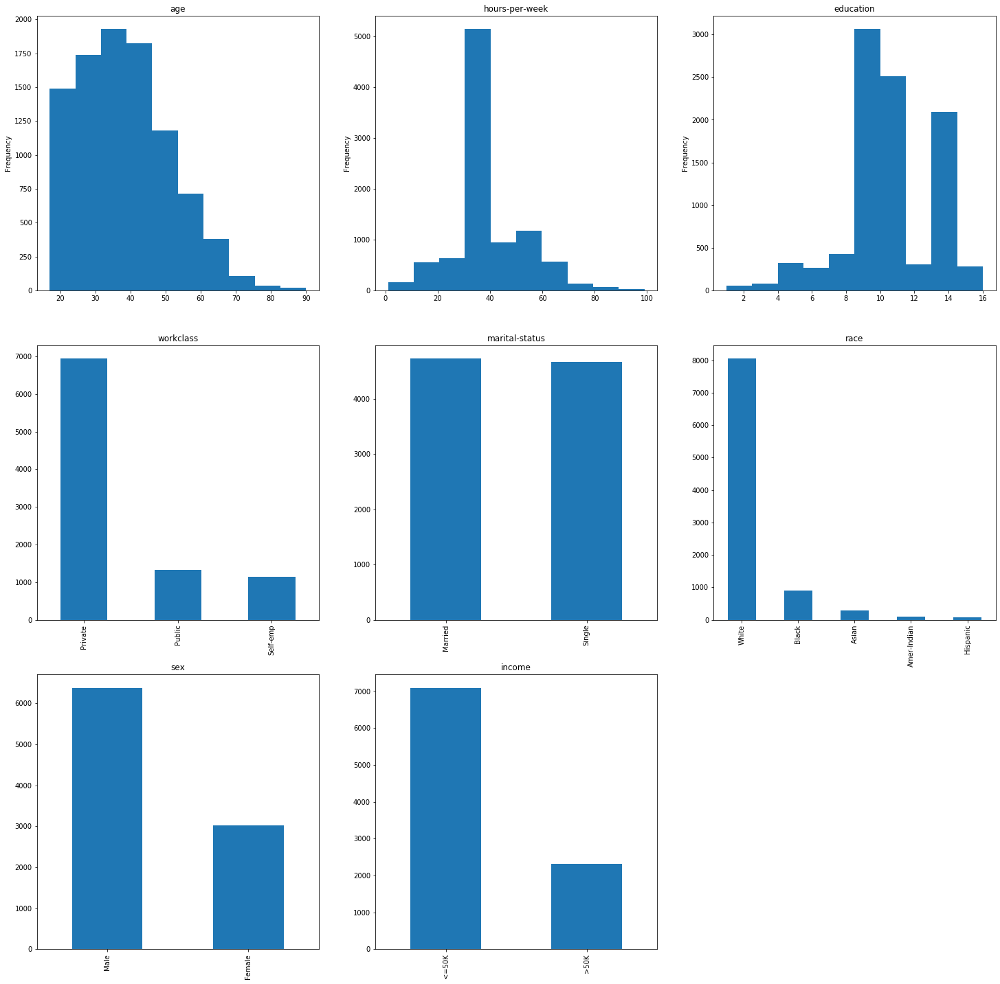

In [28]:
fig = plt.figure(figsize=(25,25))
####print("histogram")
ax1 = fig.add_subplot(3,3,1)
AdultMod["age"].plot(kind="hist", bins=10,title='age')

ax2 = fig.add_subplot(3,3,2)
AdultMod["hours-per-week"].plot(kind="hist", bins=10,title="hours-per-week")

ax3 = fig.add_subplot(3,3,3)
AdultMod["education"].plot(kind="hist", bins=10,title='education')

print("bar chat")
ax4 = fig.add_subplot(3,3,4)
AdultMod["workclass"].value_counts().plot(kind='bar',title="workclass")

ax5 = fig.add_subplot(3,3,5)
AdultMod["marital-status"].value_counts().plot(kind='bar',title ="marital-status")

ax6 = fig.add_subplot(3,3,6)
AdultMod["race"].value_counts().plot(kind='bar',title ="race")

ax7 = fig.add_subplot(3,3,7)
AdultMod["sex"].value_counts().plot(kind='bar',title ="sex")

ax8 = fig.add_subplot(3,3,8)
AdultMod["income"].value_counts().plot(kind='bar',title ="income")



#### for the age, hours per week and educaiton, we discover that the distrubution is not rnomal, so maybe we can normalize or re collect the data. also for the other attributes, only the marital-status are almost equal, others have unfair counts.


Perform the following cross-tabulations (including generating bar charts): education+race, work-class+income, work-class+race, and race+income. In the latter case (race+income) also create a table or chart showing percentages of each race category that fall in the low-income group. Discuss your observations from this analysis.

race       Amer-Indian  Asian  Black  Hispanic  White
education                                            
1                    0      0      1         0     11
2                    0      1      4         3     38
3                    0      4      5         1     71
4                    5      5     14         6    150
5                    0      3     19         2    118
6                    8      3     30         4    223
7                    4      6     49         4    261
8                    0      2     17         3     78
9                   35     67    350        23   2590
10                  26     64    206        11   1818
11                   5     10     33         4    337
12                   4      5     33         3    259
13                   5     75    102         8   1387
14                   0     27     20         1    467
15                   0     11      5         2    153
16                   0      8      4         0    101


<Figure size 1440x1152 with 0 Axes>

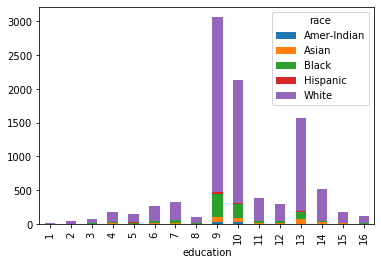

In [29]:
fig = plt.figure(figsize=(20,16))

er=pd.crosstab(AdultMod.education,AdultMod.race)
print(er)
er.plot.bar(stacked=True)
plt.legend(title='race')

#### In this garph most proportion are in 9,10 ,13 and also race in White has the most in each of them!

income     <=50K  >50K
workclass             
Private     5443  1504
Public       925   392
Self-emp     725   423


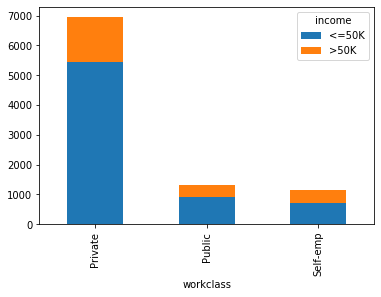

In [30]:
wi=pd.crosstab(AdultMod["workclass"],AdultMod["income"])
print(wi)
wi.plot.bar(stacked=True)
plt.legend(title='income')

#### In this garph, public and Self-emp is around 3 times or 2 times difference in income,  but  Private workclass has the huge gap almost close to 5 times!

race       Amer-Indian  Asian  Black  Hispanic  White
workclass                                            
Private             65    204    664        64   5950
Public              20     48    192         5   1052
Self-emp             7     39     36         6   1060


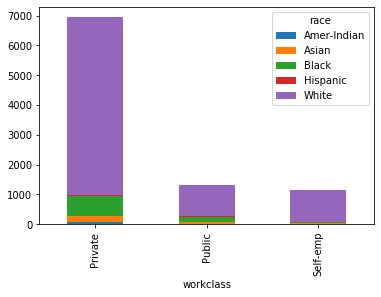

In [31]:
wr=pd.crosstab(AdultMod["workclass"],AdultMod["race"])
print(wr)
wr.plot.bar(stacked=True)
plt.legend(title='race')

#### In this garph, seems Private and Public has similar patten but  Self-emp Asian and  Black are close same to Hispanic and Amer-Indian. White has more percent people are Self-emp than othger race.

income       <=50K  >50K
race                    
Amer-Indian   0.90  0.10
Asian         0.77  0.23
Black         0.87  0.13
Hispanic      0.92  0.08
White         0.74  0.26


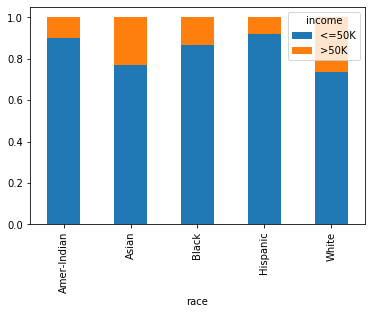

In [32]:
ri=pd.crosstab(AdultMod["race"],AdultMod["income"]).apply(lambda r: r/r.sum(), axis=1)
print(ri)
ri.plot.bar(stacked=True)
plt.legend(title='income')

##### In this we discover that Whtie and Asian has more percentage people has over 50k in their race!  

Compare and contrast the characteristics of the low-income and high-income categories across the different attributes.

#### Predictive Modeling and Model Evaluation:
Using either Pandas or Scikit-learn, create dummy variables for the categorical attributes. Then separate the target attribute ("income_>50K") from the attributes used for training. [Note: you need to drop "income_<=50K" which is also created as a dummy variable in earlier steps).


In [33]:
dum_AdultMod=pd.get_dummies(AdultMod)
dum_AdultMod.drop(['income_<=50K'], axis=1,inplace=True)
#print(dum_AdultMod.columns)
data_all=dum_AdultMod[['age', 'education', 'hours-per-week', 'workclass_Private',
       'workclass_Public', 'workclass_Self-emp', 'marital-status_Married',
       'marital-status_Single', 'race_Amer-Indian', 'race_Asian', 'race_Black',
       'race_Hispanic', 'race_White', 'sex_Female', 'sex_Male']]
data_class=dum_AdultMod['income_>50K']
#train_class

AM_train, AM_test, AM_target_train, AM_target_test = train_test_split(data_all, data_class, 
                                                                      test_size=0.2, random_state=33)

print(AM_test.shape)
AM_test[0:5]


(1883, 15)


,age,education,hours-per-week,workclass_Private,workclass_Public,workclass_Self-emp,marital-status_Married,marital-status_Single,race_Amer-Indian,race_Asian,race_Black,race_Hispanic,race_White,sex_Female,sex_Male
8419,56.0,10,45,1,0,0,1,0,0,0,0,0,1,0,1
2629,54.0,9,45,1,0,0,1,0,0,0,0,0,1,0,1
2523,52.0,11,35,1,0,0,0,1,0,0,0,0,1,1,0
7143,42.0,16,60,0,0,1,1,0,0,0,0,0,1,0,1
5902,30.0,9,50,0,0,1,1,0,0,0,0,0,1,0,1


Use scikit-learn to build classifiers uisng Naive Bayes (Gaussian), decision tree (using "entropy" as selection criteria), and linear discriminant analysis (LDA). For each of these perform 10-fold cross-validation (using cross-validation module in scikit-learn) and report the overall average accuracy.

In [34]:
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

nbclf = naive_bayes.GaussianNB()
nb_scores = cross_val_score(nbclf, data_all, data_class, cv=10)
#print("Naive Bayes (Gaussian) \n{}".format(cv_scores))
print("Naive Bayes (Gaussian) \n Overall Accuracy: %0.2f (+/- %0.2f)" % 
      (nb_scores.mean(), nb_scores.std() * 2))

treeclf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=5)
DT_scores = cross_val_score(treeclf, data_all, data_class, cv=10)
#print("Decision Tree \n{}".format(DT_scores))
print("Decision Tree \n Overall Accuracy: %0.2f (+/- %0.2f)" % 
      (DT_scores.mean(), DT_scores.std() * 2))

ldclf = LinearDiscriminantAnalysis()
LD_scores = cross_val_score(ldclf, data_all, data_class, cv=10)
#print("Linear Discriminant Analysis \n{}".format(LD_scores))
print("Linear Discriminant Analysis \n Overall Accuracy: %0.2f (+/- %0.2f)" % 
      (LD_scores.mean(), LD_scores.std() * 2))


Naive Bayes (Gaussian) 
 Overall Accuracy: 0.72 (+/- 0.02)
Decision Tree 
 Overall Accuracy: 0.77 (+/- 0.02)


/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.7/site-packages/sklearn

Linear Discriminant Analysis 
 Overall Accuracy: 0.81 (+/- 0.02)



For the decision tree model (generated on the full training data), generate a visualization of tree and submit it as a separate file (png, jpg, or pdf) or embed it in the Jupyter Notebook.

In [35]:
import graphviz
from sklearn.tree import export_graphviz

treeclf = tree.DecisionTreeClassifier(criterion='entropy', min_samples_split=5)
treeclf = treeclf.fit(data_all, data_class)
print ("Accuracy on Training: ",  treeclf.score(data_all, data_class))

export_graphviz(treeclf,out_file='tree.dot', feature_names=data_all.columns, class_names=['0','1'])

with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph, format="pdf")

Accuracy on Training:  0.912027199320017


In [36]:
system(dot -Tpng tree.dot -o dtree.png)

[]

In [37]:
from IPython.display import Image
Image(filename='dtree.png')

In [38]:
print("Feature Importances:\n{}".format(treeclf.feature_importances_))

Feature Importances:
[0.28 0.21 0.15 0.02 0.02 0.02 0.23 0.   0.   0.01 0.01 0.   0.02 0.01 0.01]


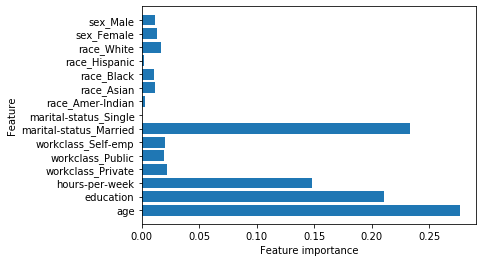

In [39]:
import pylab as plt
%matplotlib inline

def plot_feature_importances(model, n_features, feature_names):
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), feature_names)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)

plot_feature_importances(treeclf, len(data_all.columns), data_all.columns)